# Design

# Imports / Global Variables

In [1]:
# Imports

import sys  
sys.path.insert(0, "../src")
from find_donors import *                     # Module containing donor_finder

# Print parameters

pd.set_option('expand_frame_repr', False)     # print(df) will show all DataFrame columns.
import plotly.io as pio                       # Need this so plotly images in a Jupyter notebook show up in GitHub.
pio.renderers.default="plotly_mimetype"       # "   "

# Global variables

CENSUS_FILE = "../data/census_cleaned.csv"
MODEL_FILE = "../src/model.pkl"

# Data Loader

In [2]:
# Initialize datasets

dl = DataLoader("income")
df_features_raw, s_targets_raw = dl.load(CENSUS_FILE)

# Print datasets (raw data)

print()
print("FEATURES (RAW DATA)")
print()
display(df_features_raw)

print()
print("TARGETS (RAW DATA)")
print()
display(s_targets_raw)


FEATURES (RAW DATA)



,age,workclass,education-level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,39,state-gov,bachelors,13.0,never-married,adm-clerical,not-in-family,white,male,2174.0,0.0,40.0,united-states
1,50,self-emp-not-inc,bachelors,13.0,married-civ-spouse,exec-managerial,husband,white,male,0.0,0.0,13.0,united-states
2,38,private,hs-grad,9.0,divorced,handlers-cleaners,not-in-family,white,male,0.0,0.0,40.0,united-states
3,53,private,11th,7.0,married-civ-spouse,handlers-cleaners,husband,black,male,0.0,0.0,40.0,united-states
4,28,private,bachelors,13.0,married-civ-spouse,prof-specialty,wife,black,female,0.0,0.0,40.0,cuba
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45217,33,private,bachelors,13.0,never-married,prof-specialty,own-child,white,male,0.0,0.0,40.0,united-states
45218,39,private,bachelors,13.0,divorced,prof-specialty,not-in-family,white,female,0.0,0.0,36.0,united-states
45219,38,private,bachelors,13.0,married-civ-spouse,prof-specialty,husband,white,male,0.0,0.0,50.0,united-states
45220,44,private,bachelors,13.0,divorced,adm-clerical,own-child,asian-pac-islander,male,5455.0,0.0,40.0,united-states



TARGETS (RAW DATA)



0        <=50k
1        <=50k
2        <=50k
3        <=50k
4        <=50k
         ...  
45217    <=50k
45218    <=50k
45219    <=50k
45220    <=50k
45221     >50k
Name: income, Length: 45222, dtype: object

# Data Pre-Processor

In [3]:
# Initialize pre-processed features and targets

df_features_pre = df_features_raw.copy()
s_targets_pre = s_targets_raw.copy()
    
# Pre-processing parameters    
    
log_features = ["capital-gain", "capital-loss"]
log_offsets = [1,1]
numerical_features = ["age", "education-num", "capital-gain", "capital-loss", "hours-per-week"]
map_targets = {"<=50k": 0, ">50k": 1}

# Initialize Data Pre-Processor

dpp = DataPreprocessor(log_features, log_offsets, numerical_features, map_targets)


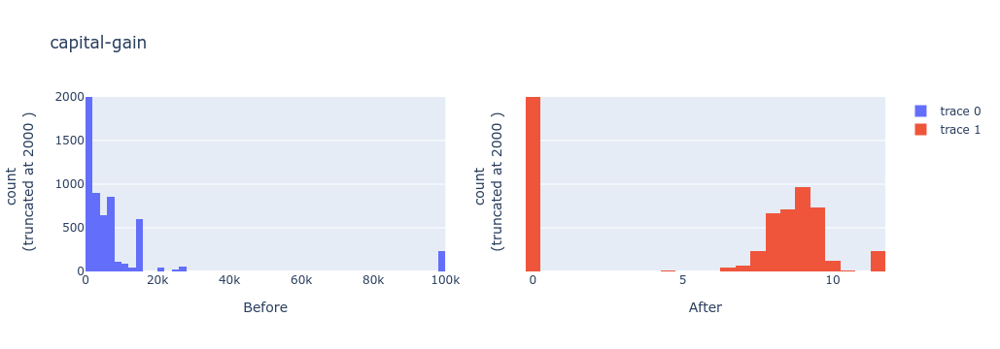

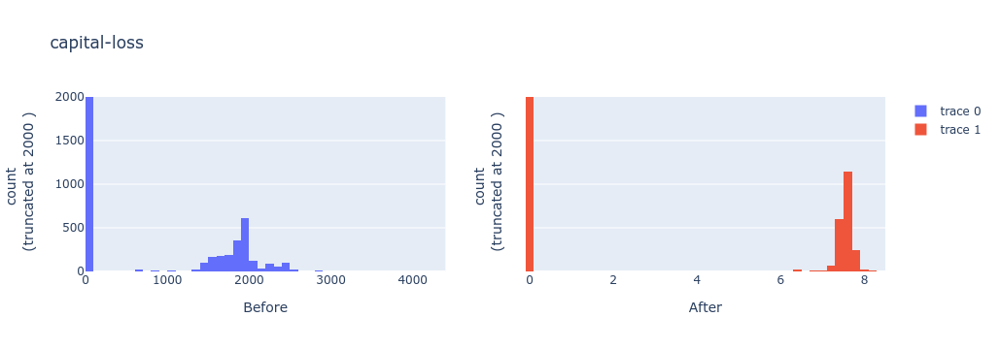

In [4]:
# Log transform skewed features

df_features_pre = dpp.log_transform(df_features_pre)    

for ft in log_features:
    print_pre_feature(df_features_raw[ft], df_features_pre[ft], 50, 0, 2000)

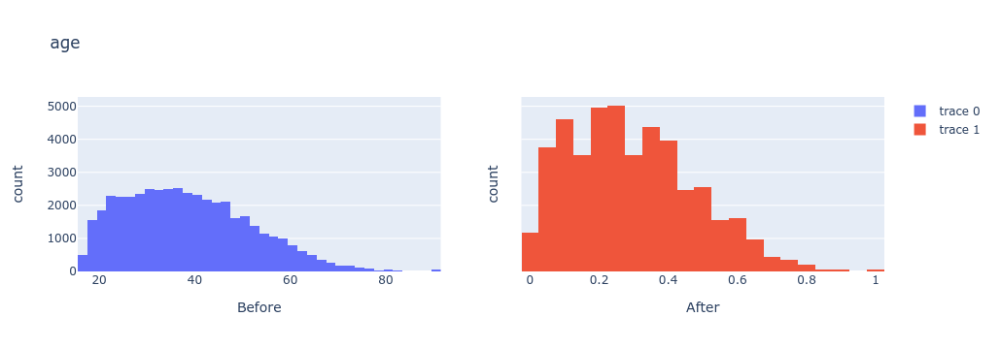

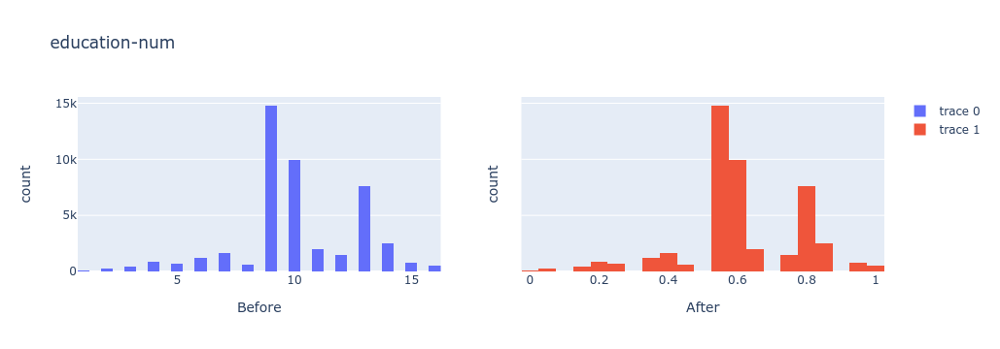

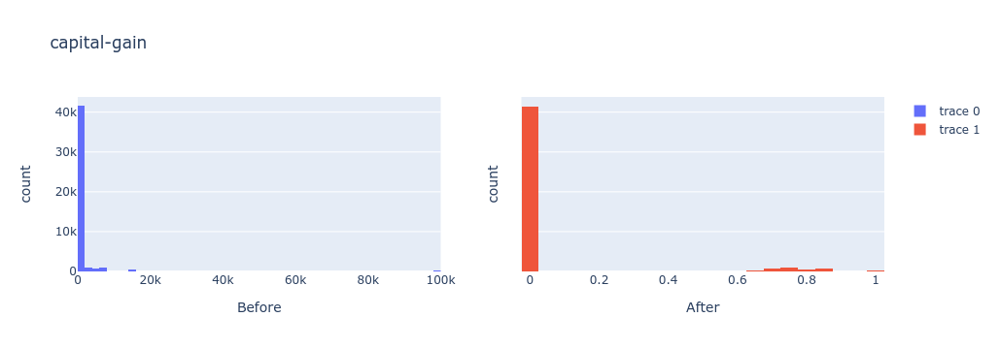

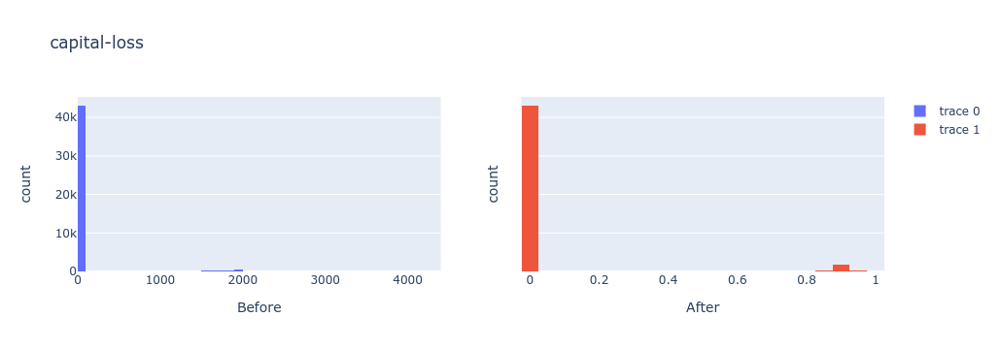

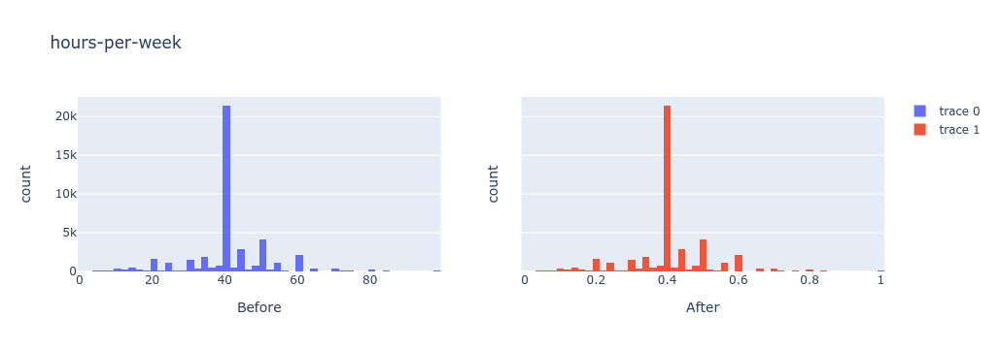

In [5]:
# Normalize numerical features

df_features_pre = dpp.normalize(df_features_pre)

for ft in numerical_features:
    print_pre_feature(df_features_raw[ft], df_features_pre[ft], 50)

In [6]:
# One-hot encode categorical features

df_features_pre = dpp.one_hot_encode(df_features_pre)

# Print example for 1 categorical feature
ft = "workclass"
display(df_features_raw[[ft]])    
display(df_features_pre[[col for col in df_features_pre.columns if ft in col]])    

,workclass
0,state-gov
1,self-emp-not-inc
2,private
3,private
4,private
...,...
45217,private
45218,private
45219,private
45220,private


,workclass_federal-gov,workclass_local-gov,workclass_private,workclass_self-emp-inc,workclass_self-emp-not-inc,workclass_state-gov,workclass_without-pay
0,0,0,0,0,0,1,0
1,0,0,0,0,1,0,0
2,0,0,1,0,0,0,0
3,0,0,1,0,0,0,0
4,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...
45217,0,0,1,0,0,0,0
45218,0,0,1,0,0,0,0
45219,0,0,1,0,0,0,0
45220,0,0,1,0,0,0,0


In [7]:
# Integer encode targets

s_targets_pre = dpp.integer_encode(s_targets_pre)

display(s_targets_pre)

0        0
1        0
2        0
3        0
4        0
        ..
45217    0
45218    0
45219    0
45220    0
45221    1
Name: income, Length: 45222, dtype: int64

In [8]:
# Sanity check

# DataPreprocessor.preprocess_features()

df_temp = dpp.preprocess_features(df_features_raw)
diff = df_features_pre != df_temp

print()
print("Check if DataPreprocessor.preprocess_features() working correctly")
print("Should print '0' if check sucessful.")
print(diff.sum().sum())

# DataPreprocessor.preprocess_targets()

s_temp = dpp.preprocess_targets(s_targets_raw)
diff = s_targets_pre != s_temp

print()
print("Check if DataPreprocessor.preprocess_targets() working correctly")
print("Should print '0' if check sucessful.")
print(diff.sum())



Check if DataPreprocessor.preprocess_features() working correctly
Should print '0' if check sucessful.
0

Check if DataPreprocessor.preprocess_targets() working correctly
Should print '0' if check sucessful.
0


# Design - Naive Predictor

In [9]:
# Naive Predictor

def print_naive_predictor_metrics(s: pd.Series, beta = 1) -> None:
    """ Print metrics of naive predictor for Series.
    
    s values must be 0's (False) and 1's (True).
    
    """
    
    total = len(s)   # Total number of data points

    P = np.sum(s)    # Total number of real positives.
    N = total - P    # Total number of real negatives.

    # Predictions of naive predictor

    TP = P      # Everyone predicted "high income earner"
    FP = N
    TN = 0      # No one predicted "low income earner"
    FN = 0
    
    # Metrics
    
    accuracy = (TP + TN) / total
    precision = (TP) / (TP + FP)
    recall = (TP) / (TP + FN)
    fbeta_score = (1 + beta**2) * (precision*recall) / (beta**2 * precision + recall)
    
    # Print results
    
    print("NAIVE PREDICTOR PREDICTIONS")
    print()
    print("Total number of data points:    ", total)
    print()
    print("Total number of real positives: ", P)
    print("Total number of real negatives: ", N)
    print()
    print("Accuracy:                       ", accuracy)
    print("Precision:                      ", precision)
    print("Recall:                         ", recall)
    print("F-beta score (beta =", beta, "):     ", fbeta_score)

    
print_naive_predictor_metrics(s_targets_pre, 0.5)




NAIVE PREDICTOR PREDICTIONS

Total number of data points:     45222

Total number of real positives:  11208
Total number of real negatives:  34014

Accuracy:                        0.2478439697492371
Precision:                       0.2478439697492371
Recall:                          1.0
F-beta score (beta = 0.5 ):      0.29172913543228385


# Design - Training Data Split

In [10]:
# Split training/testing data

def split_train_valid_test(df: pd.DataFrame,     # Features
                           s: pd.Series,         # Targets
                           train_ratio: float,
                           valid_ratio: float,
                           test_ratio: float):

    # (Train + valid) / test split

    ratio = test_ratio
    X_train_valid, X_test, y_train_valid, y_test = train_test_split(df, s, test_size = ratio)
    
    # Train / valid split
    
    ratio = (valid_ratio) / (train_ratio + valid_ratio)    
    X_train, X_valid, y_train, y_valid = train_test_split(X_train_valid, 
                                                          y_train_valid, 
                                                          test_size = ratio)
    
    return X_train, X_valid, X_test, y_train, y_valid, y_test


X_train, X_valid, X_test, y_train, y_valid, y_test = split_train_valid_test(df_features_pre,
                                                                            s_targets_pre,
                                                                            0.60,
                                                                            0.20,
                                                                            0.20)


print("df_features_pre.shape: ", df_features_pre.shape)
print("s_targets_pre.shape:   ", s_targets_pre.shape)
print()
print("X_train.shape: ", X_train.shape)
print("y_train.shape: ", y_train.shape)
print("X_valid.shape: ", X_valid.shape)
print("y_valid.shape: ", y_valid.shape)
print("X_test.shape:  ", X_test.shape)
print("y_test.shape:  ", y_test.shape)


df_features_pre.shape:  (45222, 103)
s_targets_pre.shape:    (45222,)

X_train.shape:  (27132, 103)
y_train.shape:  (27132,)
X_valid.shape:  (9045, 103)
y_valid.shape:  (9045,)
X_test.shape:   (9045, 103)
y_test.shape:   (9045,)


# Design - Model Selection

In [11]:
# Train several models (with default parameters)

def train_models(models: List, X_train, X_valid, y_train, y_valid) -> pd.DataFrame:
    
    for model in models:
        
        # Train model
    
        start_time = time()
        model = model.fit(X_train, y_train)        
        train_time = time() - start_time
        
        # Predict
    
        y_hat_train = model.predict(X_train)
        y_hat_valid = model.predict(X_valid)
        
        # Evaluation metrics

        accuracy_train = accuracy_score(y_train, y_hat_train)
        accuracy_valid = accuracy_score(y_valid, y_hat_valid)
        
        conf_mat_train = confusion_matrix(y_train, y_hat_train)
        conf_mat_valid = confusion_matrix(y_valid, y_hat_valid)     
        
        fbeta_train = fbeta_score(y_train, y_hat_train, beta=0.5)
        fbeta_valid = fbeta_score(y_valid, y_hat_valid, beta=0.5)
        
        # Print results
    
        print()
        print("Model                    : ", model.__class__.__name__)
        print()
        print("Hyperparameters          : ", model.get_params())
        print()
        print("Train time               : ", train_time)
        print()
        print("Accuracy (train)         : ", accuracy_train)
        print("F-Beta (train)           : ", fbeta_train)
        print("Confusion Matrix (train) : ")
        pprint(conf_mat_train)
        print()
        print("Accuracy (valid)         : ", accuracy_valid)
        print("F-Beta (valid)           : ", fbeta_valid)
        print("Confusion Matrix (valid) : ")
        pprint(conf_mat_valid)


model_nb = GaussianNB()
model_rfc = RandomForestClassifier()
model_svc = SVC()

models = [model_nb, model_rfc, model_svc]

train_models(models, X_train, X_valid, y_train, y_valid)



Model                    :  GaussianNB

Hyperparameters          :  {'priors': None, 'var_smoothing': 1e-09}

Train time               :  0.037291765213012695

Accuracy (train)         :  0.6105705440070766
F-Beta (train)           :  0.4326748442258795
Confusion Matrix (train) : 
array([[10372, 10014],
       [  552,  6194]])

Accuracy (valid)         :  0.6150359314538419
F-Beta (valid)           :  0.43683638491764903
Confusion Matrix (valid) : 
array([[3473, 3330],
       [ 152, 2090]])

Model                    :  RandomForestClassifier

Hyperparameters          :  {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}

Train time               :  

# Design - Hyperparameter Search

In [12]:
# Model 1 - SVC - Linear kernel

if False:

    scorer = make_scorer(fbeta_score, beta=0.5)

    model = SVC()

    hyperparameters = dict()
    hyperparameters["kernel"] = ["linear"]
    hyperparameters["C"] = [0.1, 1.0, 10.0]

    gs = run_grid_search(model, hyperparameters, scorer, X_train, y_train)
    print_gs_for_report(gs)
    

In [13]:
# Model 2 - SVC - Polynomial kernel

if False:

    scorer = make_scorer(fbeta_score, beta=0.5)

    model = SVC()

    hyperparameters = dict()
    hyperparameters["kernel"] = ["poly"]
    hyperparameters["degree"] = [3, 5, 10]
    hyperparameters["C"] = [0.1, 1.0, 10.0]

    gs = run_grid_search(model, hyperparameters, scorer, X_train, y_train)
    print_gs_for_report(gs)

In [14]:
# Model 3 - SVC - RBF kernel

if False:

    scorer = make_scorer(fbeta_score, beta=0.5)    
    
    model = SVC()

    hyperparameters = dict()

    hyperparameters["kernel"] = ["rbf"]
    hyperparameters["gamma"] = ["scale", 0.1, 1.0, 10.0]
    hyperparameters["C"] = [0.1, 1.0, 10.0]

    gs = run_grid_search(model, hyperparameters, scorer, X_train, y_train)
    print_gs_for_report(gs)

# Design - Test

In [15]:
# Selected model

selected_model = SVC() # Using default parameterss

selected_model.fit(X_train, y_train)

y_hat_test = selected_model.predict(X_test)

accuracy_test = accuracy_score(y_test, y_hat_test)              
fbeta_test = fbeta_score(y_test, y_hat_test, beta=0.5)

dict_metrics = dict()
dict_metrics["metrics"] = ["Accuracy (test)", "F-Beta (test)"]
dict_metrics["values"] = [accuracy_test, fbeta_test]

df_metrics = pd.DataFrame(dict_metrics)

print(df_metrics.to_markdown(index=False))


| metrics         |   values |
|:----------------|---------:|
| Accuracy (test) | 0.840796 |
| F-Beta (test)   | 0.684663 |


In [16]:
# Save model to file

with open(MODEL_FILE, "wb") as f:
    pickle.dump(selected_model, f)
